# The New Turing Omnibus
## Table of contents
- [Chapter 4. Simulation: The Monte Carlo Method](#chapter4)
- [Chapter 8. Random numbers: the Chaitin-Kolmogoroff theory](#chapter8)

## Chapter 4. Simulation: The Monte Carlo Method <a name="chapter4"></a>

Bank teller queue simulation (flow diagram in Figure 4.4)

In [40]:
import math
import random
import time
from datetime import datetime


# Set parameters
alpha_ta = 3.0  # mean interarrival time in seconds
alpha_ts = 1.0  # mean service time in seconds
c = 5          # simulation length (event counter)

def invcum(x, alpha):
    '''
    Calculate the inverse of the cumulative negative exponential distribution.
    Alpha is the mean interarrival time in seconds.
    '''
    return -alpha * math.log(1 - x)

def gen_t(alpha):
    '''Generate a random interarrival time given mean time alpha (seconds)'''
    return invcum(random.random(), alpha)

def mcs(alpha_ta=alpha_ta, alpha_ts=alpha_ts, c=c):
    '''Monte Carlo simulation function'''
    
    def gen_ta():
        '''TA is time to arrival of the next customer at the teller'''
        return gen_t(alpha_ta)

    def gen_ts():
        '''TS is service time of customers at the teller'''
        return gen_t(alpha_ts)

    # Initialize variables
    ta, ts = gen_ta(), gen_ts()
    q = 1  # queue size

    # Start simulation
    print(f'Start time: {datetime.now().time()}')
    print(f'{q} customers in queue')

    while c > 0:
        c -= 1
        print(f'TA = {ta}, TS = {ts}')

        if ta < ts or q == 0:
            if q > 0:
                # Decrement TS clock by TA
                ts -= ta
            # Wait for TA
            time.sleep(ta)
            # Add new customer to queue
            q += 1
            print(f'New customer arrived at {datetime.now().time()}')
            print(f'{q} customers in queue')
            # Generate next random TA
            ta = gen_ta()
        else:
            # Decrement TA clock by TS
            ta -= ts
            # Wait for TS
            time.sleep(ts)
            # Remove customer from queue
            q -= 1
            print(f'Customer left at {datetime.now().time()}')
            print(f'{q} customers in queue')
            # Generate next random TS
            ts = gen_ts()
            
            
mcs(alpha_ta=alpha_ta, alpha_ts=alpha_ts, c=c)

Start time: 14:26:06.702886
1 customers in queue
TA = 12.372055371407193, TS = 2.5167027104655344
Customer left at 14:26:09.221802
0 customers in queue
TA = 9.855352660941659, TS = 3.524457800425698
New customer arrived at 14:26:19.082612
1 customers in queue
TA = 5.006948570621268, TS = 3.524457800425698
Customer left at 14:26:22.608615
0 customers in queue
TA = 1.4824907701955699, TS = 0.04186325558958816
New customer arrived at 14:26:24.096517
1 customers in queue
TA = 3.1681754847155643, TS = 0.04186325558958816
Customer left at 14:26:24.139248
0 customers in queue


## Chapter 8. Random numbers: the Chaitin-Kolmogoroff theory <a name="chapter8"></a>

### Method 1: Linear congruential method

Here we multiply the previous sequence number by a constant, then use the modulo function to inject a non-linear component (with the added benefit of bounding the values).

We will use positive integers both for parameter values and output sequence numbers.

In [47]:
def lcm(x, k, c, m):
    '''Returns next random number after x using the linear congruential method'''
    return (k*x + c) % m


def rng_lcm(x, k, c, m, n):
    '''
    Random number generator using the linear congruential method.
    x is the seed, n is sequence length to be generated.
    '''
    for _ in range(n):
        yield(x)
        x = lcm(x, k, c, m)
        

def period(g):
    '''
    Returns the period of a random number generator sequence
    and the index of the first repeating number.
    '''
    s = []
    for i, x in enumerate(g):
        if x in s:
            return (i - s.index(x), i) 
        else:
            s.append(x)
    return (None, None)  # no period found

Let's plot pseudorandom number sequences obtained with the LCG method. We will vary the value of the modulus `m` and keep `x0`, `k`, `c` and `N` fixed.

In [48]:
%%capture
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.animation import FuncAnimation

plt.style.use('seaborn-whitegrid')
plt.rcParams.update({'font.size': 16})
plt.rcParams["animation.html"] = "jshtml"

def show_anim(rng_fun, param_range, param_name, N, ylims=(0, 1), title=''):
    x = [i for i in range(N)]
    fig1 = plt.figure(figsize=(15,4));
    ax = plt.axes(xlim=(x[0], x[-1]), ylim=ylims)
    line, = ax.plot([], [])

    def init():
        line.set_data([], [])
        plt.xlabel('i')
        plt.ylabel('rng(i)')
        plt.title(title)
        return line,

    def animate(i):
        seq = list(rng_fun(param_range[i]))
        line.set_data(x, seq)
        p, ix_p = period(seq)
        line.set_label(f'{param_name}={param_range[i]}, p=({p}, {ix_p})')
        line.set_color('r' if p is None else 'g')
        ax.legend(loc='upper right', frameon=True);
        return line,

    return FuncAnimation(fig1, animate, init_func=init, frames=len(param_range),
                         interval=1000, repeat_delay=1000, blit=True);

First let's use **'naive' human-friendly parameters** (given in book 'New Turing Omnibus', Chapter 8).

Notice how most of the sequences contain repeating sub-sequences. This is quantified by the parameter `p` (period) in the legend: `p=(10, 20)` means that a subsequence of 10 numbers (the period) starts repeating at sequence position 20. In other words, only the first 20 numbers are non-repeating, thus random-like.

Here, the chosen values of the parameters are just too small. As such, the sequences are only locally random-appearing (for `n << N`).

Some values of `m` that are prime numbers do seem to produce more random sequences, though...!

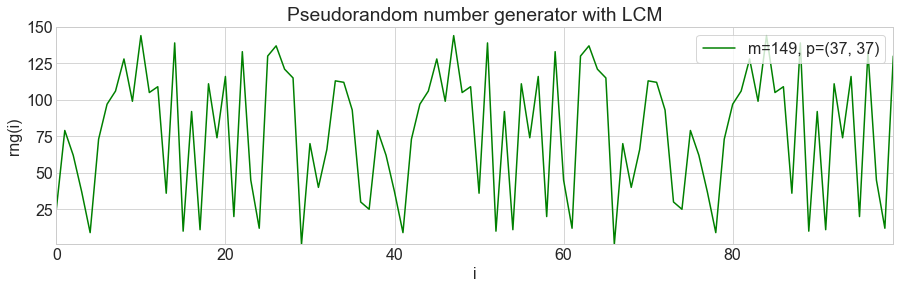

In [49]:
# Human-friendly parameters (given in book 'New Turing Omnibus', Chapter 8)
x0 = 25  # seed
k = 19   # multiplier
c = 51   # offset
m = 100  # modulus
N = 100   # simulation length (max m - 1)
m_range = list(range(m, m + 50))
ylims = (1, 150)

def rng_lcm_with_params(m):
    return rng_lcm(x0, k, c, m, N)

show_anim(rng_lcm_with_params, m_range, 'm', N, ylims=ylims, title='Pseudorandom number generator with LCM')

Now let's pick parameters used in a **real-world RNG algorithm**, IBM's infamous RANDU RNG (https://en.wikipedia.org/wiki/RANDU).

This RNG is known to perform poorly relative to alternatives. Nonetheless for a small sequence length, we can appreciate how much better it does than our previous naive parameter set.

The secret is using huge prime values for the parameters (except for the offset `c`, which is ignored).

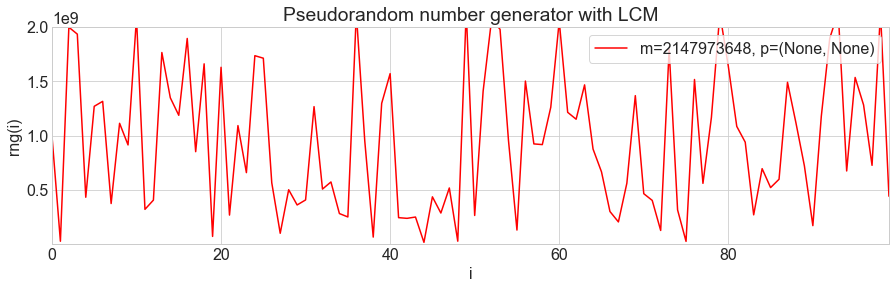

In [50]:
# Parameters from infamous RANDU RNG (wikipedia.org/wiki/RANDU)
x0 = 1e9+1  # seed (eyeballed, must be odd)
k = 65539   # multiplier
c = 0       # offset
m = 2**31   # modulus
N = 100     # simulation length (max m - 1)
m_range = list(range(m, m + 500000, 10000))
ylims = (1e5, 2e9)

def rng_lcm_with_params(m):
    return rng_lcm(x0, k, c, m, N)

show_anim(rng_lcm_with_params, m_range, 'm', N, ylims=ylims, title='Pseudorandom number generator with LCM')

How does the period vary with the modulo parameter? (longer period = greater pseudo-randomness)

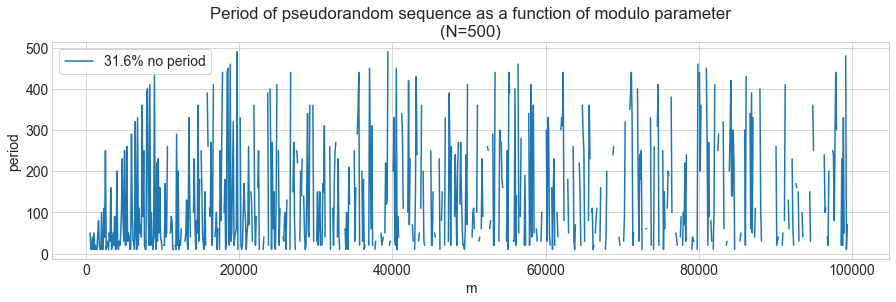

In [51]:
%matplotlib inline
import matplotlib.pyplot as plt
plt.rcParams.update({'font.size': 14})
plt.style.use('seaborn-whitegrid')

# RANDU parameters
x0 = 1e9+1  # seed (eyeballed, must be odd)
k = 65539   # multiplier
c = 0       # offset
m = 2**31   # modulus
N = 500     # simulation length (max m - 1)
m_range = list(range(500, 100000, 100))


fig = plt.figure(figsize=(15,4))
ax = plt.axes()

p_range = [period(rng_lcm(x0, k, c, m, N))[0] for m in m_range]
pcnt_no_period = sum(i is None for i in p_range) / len(p_range) * 100

plt.plot(m_range, p_range, '-', label=f'{pcnt_no_period:0.1f}% no period');
    
ax.set(xlabel='m', ylabel='period', yscale='linear',
       title=f'Period of pseudorandom sequence as a function of modulo parameter\n(N={N})');
plt.legend(frameon=True);

### Method 2: Logistic formula

Here we use a very simple non-linear function. It's referred to in the book as 'logistic', but it's actually the formula of a parabola, isn't it?

Things now get very interesting with the choice of the multiplier parameter `r`. The seed value `x0`, on the contrary, is totally irrelevant.

In [52]:
def logm(x, r):
    '''Returns next random number after x using the logistic formula'''
    return r*x * (1 - x)

def rng_log(x, r, n):
    '''
    Random number generator using the logistic method.
    x is the seed, n is sequence length to be generated.
    '''
    for _ in range(n):
        yield(x)
        x = logm(x, r)       

Check these out:
- For lots of values of `r`, the sequence starts repeating the same number
- What happens at larger values of `r`, when the `(1-x)` term becomes negative
- Completely random oscillations (chaos) suddenly appear within several intervals, most strikingly at `3.5 < r < 4.0`

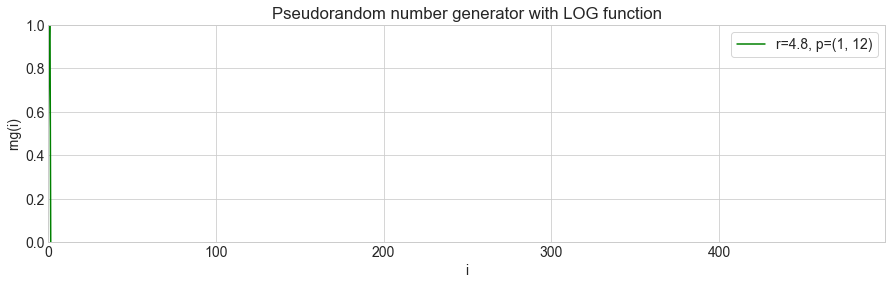

In [53]:
x0 = 0.5  # seed
N = 500   # sequence length
r_range = [i/10 for i in range(1, 49)]

def rng_log_with_params(r):
    return rng_log(x0, r, N)

show_anim(rng_log_with_params, r_range, 'r', N, title='Pseudorandom number generator with LOG function')

What combination of `x0` and `r` parameter results in no period (for a given `N`)?

Note how the seed `x0` has absolutely no effect!

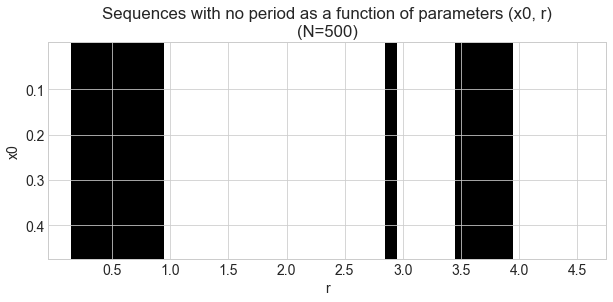

In [54]:
%matplotlib inline
import matplotlib.pyplot as plt
plt.rcParams.update({'font.size': 14})

# Calculate data
N = 500
x0_range = [i/100 for i in range(1, 49)]
r_range = [i/10 for i in range(1, 49)]

pcnt_no_period = [[0] * len(r_range)] * len(x0_range)
for ix_x0, x0 in enumerate(x0_range):
    for ix_r, r in enumerate(r_range):
        pcnt_no_period[ix_x0][ix_r] = period(rng_log(x0, r, N))[0] is None

# Plotting    
fig = plt.figure(figsize=(10,4))
ax = plt.axes()

plt.imshow(pcnt_no_period, aspect='auto');
    
ax.set(xlabel='r', ylabel='x0',
       xticks=[i*10 for i in r_range if (i*10)%5==0],
       xticklabels=[i for i in r_range if (i*10)%5==0],
       yticks=[i*100 for i in x0_range if (i*100)%10==0],
       yticklabels=[i for i in x0_range if (i*100)%10==0],
       title=f'Sequences with no period as a function of parameters (x0, r)\n(N={N})');

plt.show()